<a href="https://colab.research.google.com/github/moonorange/42_libft/blob/main/model_assisted_labeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Labelbox model assisted labeling

This tutorial implements Labelbox model assisted labeling (MAL) system (https://labelbox.com/docs/automation/model-assisted-labeling) for object detection (bbox) and image segmentation (masks) with Facebook Detectron2 framework. MAL integrates Labelbox labeling workflow directly with the user AI model. MAL is a superior technique to quickly improve AI model performance. 

#### ![MAL](https://files.helpdocs.io/3fu9z5w5lj/articles/6o94494p7f/1587521917175/model-assisted-labeli.png)

### What you need and know before getting started?
- Labelbox API key
- A partially labeled project in Labelbox. (bounding box or segmentation)
- (optional) GCS credentials to upload segmentation masks to a bucket.
- For ideal performance, replace Facebook Detectron2 with your own AI model.
---

### Workflow
**Data preparation (egress)**
- Generate Labelbox project export and download labels (Labelbox)
- Access ontology (Labelbox)
- Convert labels into Facebook Detectron2 custom format (Labelbox)

**Train your AI model**
- Visualize Detectron2 training data (Labelbox)
- Configure Detectron2 Training configuration (Labelbox)
- Run Detectron2 training (Labelbox)
- Evaluate Detectron2 performance (Labelbox)

**Data preparation (inference)**
- Compute unlabeled datarows within a project for inferencing (Labelbox)

**Model inferencing on unlabeled data**
- Run Detectron2 inference on queued datarows (Detectron)

**Data preparation (ingress)**
- Convert Detectron2 inference results to Labelbox annotation import format (Labelbox)
- Initiate bulk import request to import pre-labels (Labelbox)


---

# About
[Labelbox](https://labelbox.com/) is a training data platform to easily create training data and improve model performance. 

#### ![Labelbox workmark](https://i.imgur.com/ufIZpXq.png)

# Install dependencies 

In [ ]:
# !pip3 install --upgrade pip setuptools
!pip3 install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip3 install cython pyyaml==5.1
!pip3 install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

# install detectron2:
!pip3 install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
# !pip3 install opencv-python
!pip3 install labelbox
!pip3 install simplejson
!pip3 install progressbar
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
!pip3 install google-cloud-storage

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8MB 25kB/s 
     |████████████████████████████████| 6.6MB 50.5MB/s 
  Found existing installation: torch 1.7.0+cu101
    Uninstalling torch-1.7.0+cu101:
      Successfully uninstalled torch-1.7.0+cu101
  Found existing installation: torchvision 0.8.1+cu101
    Uninstalling torchvision-0.8.1+cu101:
      Successfully uninstalled torchvision-0.8.1+cu101
     |████████████████████████████████| 276kB 5.4MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=682aeb9411d380097139643ccfa6c01e1c7882bd2ca7960f50d9dd0e13b3f261
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip

     |████████████████████████████████| 133kB 4.3MB/s 
  Created wheel for progressbar: filename=progressbar-2.5-cp36-none-any.whl size=12075 sha256=76214a119d6324359803119be60978cb386985f4445596a7c94bf7223d8bd300
  Stored in directory: /root/.cache/pip/wheels/c0/e9/6b/ea01090205e285175842339aa3b491adeb4015206cda272ff0
Successfully built progressbar
1.5.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
!pip3 install ipdb

  Created wheel for ipdb: filename=ipdb-0.13.4-cp36-none-any.whl size=10973 sha256=9e62a75e12d54ef3241ef5af8411c4425ee1a8c88e94b85a9643eb4204ce3193
  Stored in directory: /root/.cache/pip/wheels/56/51/e4/c91c61e3481a1a967beb18c4ea7a2b138a63cce94170b2e206
Successfully built ipdb


# Import libraries

In [ ]:

##General utilities
import datetime as dt
import os
import sys
import random
import time
from itertools import cycle
from uuid import uuid4
import requests
from pprint import pprint
from multiprocessing.pool import ThreadPool
import os, os.path
import numpy as np
import cv2
from skimage import io
import simplejson as json
import random
from datetime import datetime
import time
import shutil
from matplotlib import pyplot as plt
from pycocotools import mask
import progressbar
from PIL import Image
from google.cloud import storage
from google.colab.patches import cv2_imshow

##Labelbox utilities
import labelbox as lb
from labelbox import Project, Dataset
from labelbox.schema.bulk_import_request import BulkImportRequest
from labelbox.schema.enums import BulkImportRequestState

##Facebook Detectron2 utilities
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2 import model_zoo
from detectron2.evaluation import COCOEvaluator
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

In [82]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd drive/MyDrive/

[Errno 2] No such file or directory: 'drive/MyDrive/'
/content/drive/MyDrive


In [83]:
ls Labelbox/

 auto-polygon-13dd06197bd7.json   labelbox_api_key.txt   shapefiles/
'Colab Notebooks'/               'Q&A (1).gdoc'
 Guideline.gdoc                  'Q&A.gdoc'


# Configure parameters

In [86]:
##Constants and configuration
os.environ['LB_API_KEY'] = "Labelbox/labelbox_api_key.txt"
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = "Labelbox/auto-polygon-13dd06197bd7.json" # Needed to upload segmentation masks. Create GCS service account key (https://cloud.google.com/iam/docs/creating-managing-service-account-keys)

### Uncomment the object detection example to use with object detection projects

# # Object detection example
# PROJECT_ID=5'ckc787iv0gs560815d3u40kez' #labelbox project id
# DATASETS=['ckc24bd45nng409881q99fbvw'] #labelbox dataset ids attached to the project
# MODE = 'object-detection'


#Segmentation example 
PROJECT_ML='ckitso57wf3eg07187z36noxx' #ml-assisted pre-labeling
DATASETS=['ckiifw3yb0a6u0y9bdl3805wl'] #labelbox dataset ids attached to the project
PROJECT_TRAIN='ckigvoui3kzza07187d7paz15'
PROJECT_TEST='ckigvsmb7b9aa0775ig391gz1'
DATA_LOCATION = 'farmlands/'
MODE = 'segmentation-rle'

## Universal configuration
DOWNLOAD_IMAGES = True # Download data from labelbox. Set false for re-runs when data already exists locally
VALIDATION_RATIO = 0.1 # Validation data / training data ratio
NUM_CPU_THREADS = 8 # for multiprocess downloads
NUM_SAMPLE_LABELS = 0 # Use 0 to use all of the labeled training data from project. Otherwise specify number of labeled images to use. Use smaller number for faster iteration. 
PRELABELING_THRESHOLD = 0.8 # minimum model inference confidence threshold to be uploaded to labelbox
HEADLESS_MODE = False # Set True to skip previewing data or model results

DETECTRON_DATASET_TRAINING_NAME = 'prelabeling-train'
DETECTRON_DATASET_VALIDATION_NAME = 'prelabeling-val'
DETECTRON_DATASET_ML_NAME = 'prelabeling-ml'

BUCKET_NAME = "test-ml-assisted-labeling"

# Functions

In [ ]:
## get project ontology from labelbox
def get_ontology(project_id):
    response = client.execute(
                """
                query getOntology (
                    $project_id : ID!){ 
                    project (where: { id: $project_id }) { 
                        ontology { 
                            normalized 
                        } 
                    }
                }
                """,
                {"project_id": project_id})
            
    ontology = response['project']['ontology']['normalized']['tools']

    ##Return list of tools and embed category id to be used to map classname during training and inference
    mapped_ontology = []
    thing_classes = []
    
    i=0
    for item in ontology:
#         if item['tool']=='superpixel' or item['tool']=='rectangle':
        item.update({'category': i})
        mapped_ontology.append(item)
        thing_classes.append(item['name'])
        i=i+1         

    return mapped_ontology, thing_classes

## Creates a new export request to get all labels from labelbox. 
def get_labels(project_id):
    should_poll = 1
    while(should_poll == 1):
        response = client.execute(
                    """
                    mutation export(
                    $project_id : ID!    
                    )
                    { 
                        exportLabels(data:{ projectId: $project_id }){ 
                            downloadUrl 
                            createdAt 
                            shouldPoll 
                        }
                    }
                    """,
                    {"project_id": project_id})
        
        if response['exportLabels']['shouldPoll'] == False:
            should_poll = 0
            url = response['exportLabels']['downloadUrl']
            headers = {"User-Agent":"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_4) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/83.0.4103.97 Safari/537.36"}

            r = requests.get(url, headers=headers)
            
            print('Export generated')
            ## writing export to disc for easier debugging
            open('export.json', 'wb').write(r.content)
            return r.content
        else:
            print('Waiting for export generation. Will check back in 10 seconds.')    
            time.sleep(10)

    return response

In [ ]:

## Get all previous predictions import (bulk import request). 
def get_current_import_requests():
    response = client.execute(
                    """
                    query get_all_import_requests(
                        $project_id : ID! 
                    ) {
                      bulkImportRequests(where: {projectId: $project_id}) {
                        id
                        name
                      }
                    }
                    """,
                    {"project_id": PROJECT_ID})
    
    return response['bulkImportRequests']

## Delete all current predictions in a project and dataset. We want to delete them and start fresh with predictions from the latest model iteration
def delete_import_request(import_request_id):
    response = client.execute(
                    """
                        mutation delete_import_request(
                            $import_request_id : ID! 
                        ){
                          deleteBulkImportRequest(where: {id: $import_request_id}) {
                            id
                            name
                          }
                        }
                    """,
                    {"import_request_id": import_request_id})
    
    return response

In [ ]:
## function to return the difference between two lists. This is used to compute the queued datarows to be used for inference. 
def diff_lists(li1, li2): 
    li_dif = [i for i in li1 + li2 if i not in li1 or i not in li2] 
    return li_dif 

## Generic data download function
def download_files(filemap):
    path, uri = filemap
    ## Download data
    if not os.path.exists(path):
        req = requests.get(uri, stream=True)
        if req.status_code == 200:
            print(path)
            with open(path, 'wb') as f:
                for chunk in req:
                    f.write(chunk)
    return path

## Converts binary image mask into COCO RLE format
def rle_encode(mask_image):
    size = list(mask_image.shape)
    pixels = mask_image.flatten()
    
    # We avoid issues with '1' at the start or end (at the corners of 
    # the original image) by setting those pixels to '0' explicitly.
    # We do not expect these to be non-zero for an accurate mask, 
    # so this should not harm the score.
    pixels[0] = 0
    pixels[-1] = 0
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] = runs[1::2] - runs[:-1:2]
    
    rle = {'counts': runs.tolist(), 'size': size}
    return rle


def load_set(dir):
    with open(dir+"dataset.json") as json_file:
        dataset_dicts = json.loads(json_file)
    return dataset_dicts

def cv2_imshow(a, **kwargs):
#     a = a.clip(0, 255).astype('uint8')
    # cv2 stores colors as BGR; convert to RGB
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)

    return plt.imshow(a, **kwargs)

In [ ]:
# GCS

def upload_to_gcs(file_name, bucket_name):
    bucket = storage_client.get_bucket(bucket_name)
    blob = bucket.blob("{}.png".format(str(uuid4())))
    blob.upload_from_filename(file_name)
    return blob.generate_signed_url(dt.timedelta(weeks=10))

def mask_to_cloud(img, mask_array, filename, bucket_name):
    num_instances = mask_array.shape[0]
    mask_array = np.moveaxis(mask_array, 0, -1)
    mask_array_instance = []
    output = np.zeros_like(img)
    for i in range(num_instances):
        mask_array_instance.append(mask_array[:, :, i:(i+1)])
        output = np.where(mask_array_instance[i] == True, 255, output)
    im = Image.fromarray(output)
    im.save(DATA_LOCATION+'tmp/'+filename+'.png')
    
    cloud_mask = upload_to_gcs(DATA_LOCATION+'tmp/'+filename+'.png', bucket_name)
    # plt.imshow(im)
    return cloud_mask

In [ ]:

## Convert and load labelbox labels into Detectron2 format
def load_detectron2_dataset(labels, ontology, thing_classes, dir):
    dataset_dicts = []
    i = 0
    total = len(labels)

    print("Num labels processing: " + str(total))
    time.sleep(1)
    bar = progressbar.ProgressBar(maxval=total, \
        widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])
    bar.start()
    
    for label in labels:
        
        try:
            record = {}
            filename = os.path.join(dir, label['External ID'])
            
            ##scikit needed to raise exception if unable to read the image
            _ = io.imread(filename)
            
            height, width = cv2.imread(filename).shape[:2]

            record["file_name"] = filename
            record["height"] = height
            record["width"] = width
            record["image_id"] = label['ID']

            objs = []

            for instance in label['Label']['objects']:
                category_id = thing_classes.index(instance['title'])
#                 print(category_id)
                if MODE == 'object-detection':
                    obj = {
                            "bbox": [instance['bbox']['left'], instance['bbox']['top'], instance['bbox']['width'], instance['bbox']['height']],
                            "bbox_mode": BoxMode.XYWH_ABS,
                            "segmentation": [],
                            "category_id": category_id,
                        }
                    objs.append(obj)

                if MODE == 'segmentation-rle':
                    path = DATA_LOCATION+masks+'/'+label['External ID']
                    mask_URI = instance['instanceURI']
                    downloaded_path = download_files((path, mask_URI))
                    im = cv2.imread(downloaded_path,0)

                    binary = np.array(im)

                    rle = mask.encode(np.asfortranarray(binary))
                    ground_truth_bounding_box = mask.toBbox(rle)

                    obj = {
                            "bbox": ground_truth_bounding_box.tolist(),
                            "bbox_mode": BoxMode.XYWH_ABS,
                            "segmentation": rle,
                            "category_id": category_id,
                            "iscrowd": 0
                        }
                    objs.append(obj)

            record["annotations"] = objs
            dataset_dicts.append(record)
            
            bar.update(i+1)
            i=i+1
        except Exception as e:
            print('Exception: ', e)

    bar.finish()
            
    ## Write detectron2 dataset file to disk for easier debugging
    f = open(dir+"dataset_dict.json","w")
    f.write(json.dumps(dataset_dicts))
    f.close()
    
    return dataset_dicts

class CocoTrainer(DefaultTrainer):

    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):

        if output_folder is None:
            os.makedirs("coco_eval", exist_ok=True)
            output_folder = "coco_eval"

        return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
storage_client = storage.Client()

In [ ]:
storage_client.get_bucket(BUCKET_NAME)

<Bucket: test-ml-assisted-labeling>

In [ ]:
## function to return the difference between two lists. This is used to compute the queued datarows to be used for inference. 
def diff_lists(li1, li2): 
    li_dif = [i for i in li1 + li2 if i not in li1 or i not in li2] 
    return li_dif 

## Generic data download function
def download_files(filemap):
    path, uri = filemap
    ## Download data
    if not os.path.exists(path):
        req = requests.get(uri, stream=True)
        if req.status_code == 200:
            print(path)
            with open(path, 'wb') as f:
                for chunk in req:
                    f.write(chunk)
    return path

## Converts binary image mask into COCO RLE format
def rle_encode(mask_image):
    size = list(mask_image.shape)
    pixels = mask_image.flatten()
    
    # We avoid issues with '1' at the start or end (at the corners of 
    # the original image) by setting those pixels to '0' explicitly.
    # We do not expect these to be non-zero for an accurate mask, 
    # so this should not harm the score.
    pixels[0] = 0
    pixels[-1] = 0
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] = runs[1::2] - runs[:-1:2]
    
    rle = {'counts': runs.tolist(), 'size': size}
    return rle


def load_set(dir):
    with open(dir+"dataset.json") as json_file:
        dataset_dicts = json.loads(json_file)
    return dataset_dicts

def cv2_imshow(a, **kwargs):
#     a = a.clip(0, 255).astype('uint8')
    # cv2 stores colors as BGR; convert to RGB
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)

    return plt.imshow(a, **kwargs)

In [ ]:
## function to return the difference between two lists. This is used to compute the queued datarows to be used for inference. 
def diff_lists(li1, li2): 
    li_dif = [i for i in li1 + li2 if i not in li1 or i not in li2] 
    return li_dif 

## Generic data download function
def download_files(filemap):
    path, uri = filemap
    ## Download data
    if not os.path.exists(path):
        req = requests.get(uri, stream=True)
        if req.status_code == 200:
            print(path)
            with open(path, 'wb') as f:
                for chunk in req:
                    f.write(chunk)
    return path

## Converts binary image mask into COCO RLE format
def rle_encode(mask_image):
    size = list(mask_image.shape)
    pixels = mask_image.flatten()
    
    # We avoid issues with '1' at the start or end (at the corners of 
    # the original image) by setting those pixels to '0' explicitly.
    # We do not expect these to be non-zero for an accurate mask, 
    # so this should not harm the score.
    pixels[0] = 0
    pixels[-1] = 0
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 2
    runs[1::2] = runs[1::2] - runs[:-1:2]
    
    rle = {'counts': runs.tolist(), 'size': size}
    return rle


def load_set(dir):
    with open(dir+"dataset.json") as json_file:
        dataset_dicts = json.loads(json_file)
    return dataset_dicts

def cv2_imshow(a, **kwargs):
#     a = a.clip(0, 255).astype('uint8')
    # cv2 stores colors as BGR; convert to RGB
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)

    return plt.imshow(a, **kwargs)

# Main

In [ ]:
start_time = time.time()

if os.path.exists('coco_eval'):
    shutil.rmtree('coco_eval')
    
client = lb.Client(LB_API_KEY, "https://api.labelbox.com/graphql")
# storage_client = storage.Client()

# ## Get labelbox project
pro_tr = client.get_project(PROJECT_TRAIN)
pro_te = client.get_project(PROJECT_TEST)
pro_ml = client.get_project(PROJECT_ML)

# ##Get ontology
ontology, thing_classes = get_ontology(PROJECT_TRAIN)
print('Available classes: ', thing_classes)

# ##Get labels
train_labels = json.loads(get_labels(PROJECT_TRAIN))
val_labels =  json.loads(get_labels(PROJECT_TEST))
ml_labels = json.loads(get_labels(PROJECT_ML))

# ##Split training and validation labels
# if NUM_SAMPLE_LABELS !=0:
#     val_sample = int(VALIDATION_RATIO*NUM_SAMPLE_LABELS)
#     val_labels = random.sample(labels, val_sample)
#     train_labels = random.sample(labels, NUM_SAMPLE_LABELS)
# else:
#     split = int(VALIDATION_RATIO*len(labels))
#     val_labels = labels[:split]
#     train_labels = labels[split:]
#     train_labels = labels

# ## Check and create folders for downloading data from Labelbox
train = 'train'
val = 'val'
inference = 'inference'
masks = 'masks'
tmp = 'tmp'
ml = 'ml'

if not os.path.exists(DATA_LOCATION):
    os.makedirs(DATA_LOCATION)

if not os.path.exists(DATA_LOCATION+train):
    os.makedirs(DATA_LOCATION+train)
    
if not os.path.exists(DATA_LOCATION+val):
    os.makedirs(DATA_LOCATION+val)

if not os.path.exists(DATA_LOCATION+tmp):
    os.makedirs(DATA_LOCATION+ml)
    
if not os.path.exists(DATA_LOCATION+inference):
    os.makedirs(DATA_LOCATION+inference)
    
if not os.path.exists(DATA_LOCATION+masks):
    os.makedirs(DATA_LOCATION+masks)
    
if not os.path.exists(DATA_LOCATION+tmp):
    os.makedirs(DATA_LOCATION+tmp)

Available classes:  ['Farmland']
Export generated
Export generated
Waiting for export generation. Will check back in 10 seconds.
Export generated


In [ ]:
##Download training and validation labels in parallel
train_urls = []
for label in train_labels:
    train_urls.append((DATA_LOCATION+'train/' + label['External ID'], label['Labeled Data']))

 = []
for label in val_labels:
    val_urls.append((DATA_LOCATION+'val/' + label['External ID'], label['Labeled Data']))


ml_urls = []
for label in ml_labels:
    ml_urls.append((DATA_LOCATION+'ml/' + label['External ID'], label['Labeled Data']))

In [ ]:

if(DOWNLOAD_IMAGES==True):
    print('Downloading training and validation data... \n')
    
    results_train = ThreadPool(NUM_CPU_THREADS).imap_unordered(download_files, train_urls)
    results_val = ThreadPool(NUM_CPU_THREADS).imap_unordered(download_files, val_urls)
    
    for item in results_train:
        pass
    for item in results_val:
        pass
    
    print('Finished downloading training and validation data... \n')    

### Begin FB Detectron code. 

#Load dataset into Detectron2
try:
    DatasetCatalog.register(DETECTRON_DATASET_TRAINING_NAME, lambda: load_detectron2_dataset(train_labels, ontology, thing_classes, DATA_LOCATION+'train/' ))
    DatasetCatalog.register(DETECTRON_DATASET_VALIDATION_NAME, lambda: load_detectron2_dataset(val_labels, ontology, thing_classes, DATA_LOCATION+'val/' ))
    MetadataCatalog.get(DETECTRON_DATASET_TRAINING_NAME).thing_classes=thing_classes
    MetadataCatalog.get(DETECTRON_DATASET_VALIDATION_NAME).thing_classes=thing_classes
except Exception as e:
    print(e)
    
if MODE == 'object-detection':
    model = 'COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml'
    
if MODE == 'segmentation-rle':
    model = 'COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'


##Load data and metadata for visualization and inference
dataset_dicts = DatasetCatalog.get(DETECTRON_DATASET_TRAINING_NAME)
dataset_dicts_val = DatasetCatalog.get(DETECTRON_DATASET_VALIDATION_NAME)
metadata = MetadataCatalog.get(DETECTRON_DATASET_TRAINING_NAME)

##check if the training data is loaded correctly
# if HEADLESS_MODE==False:
#     for d in dataset_dicts:
#         img = cv2.imread(d["file_name"])
#         visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=4)
#         vis = visualizer.draw_dataset_dict(d)
        
#         ## For paperspace cloud notebooks. Cloud notebooks do not support cv2.imshow.
#         plt.rcParams['figure.figsize'] = (6, 12)
#         plt.imshow(vis.get_image()[:, :, ::-1])
#         plt.show()


Finished downloading training and validation data... 

Num labels processing: 50


Exception:  'objects'


Num labels processing: 50


Exception:  'objects'


# Train Detectron2 Model

In [ ]:
def retrain_model(model_type, train_data, model_input_dir, max_iter):
  cfg = get_cfg()
  cfg.merge_from_file(model_zoo.get_config_file(model_type))
  cfg.DATASETS.TRAIN = (train_data, )
  cfg.DATASETS.TEST = (DETECTRON_DATASET_VALIDATION_NAME,)  
  cfg.TEST.EVAL_PERIOD = 150
  cfg.DATALOADER.NUM_WORKERS = 2
  cfg.MODEL.WEIGHTS = os.path.join(model_input_dir, "model_final.pth")
  cfg.SOLVER.IMS_PER_BATCH = 2 #　gpuに読み込ませるイメージ数 
  cfg.SOLVER.BASE_LR = 0.025  # Leatning Rate　基本大きい値から初めて誤差が減らなくなったら小さくしていく　毎反復ごとにちょっとずつ減らしていく　全画像を学習して減らすのもある
  cfg.SOLVER.MAX_ITER = (max_iter) # 反復回数
  cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (64) #1回の画像で反復で食わせられる画像、似たような画像が沢山あると。普通は16,32 数とタスクによって変わる
  cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 # 2 classes (farmland,back_ground)
  if MODE=='segmentation-rle':
    cfg.INPUT.MASK_FORMAT='bitmask'

  os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
  trainer = CocoTrainer(cfg) 
  trainer.resume_or_load(resume=False)
  trainer.train()
  return cfg

In [ ]:
R50_MASK = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
OUTPUT_MODEL_TRAIN_NEW = "test_mask-rcnn/output/train_new" # 2020/10/26

In [ ]:
cfg = retrain_model(R50_MASK, DETECTRON_DATASET_TRAINING_NAME, OUTPUT_MODEL_TRAIN_NEW, 100)

[12/21 03:10:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Exception:  'objects'
[12/21 03:10:16 d2.data.build]: Removed 0 images with no usable annotations. 49 images left.
[12/21 03:10:16 d2.data.common]: Serializing 49 elements to byte tensors and concatenating them all ...
[12/21 03:10:16 d2.data.common]: Serialized dataset takes 0.19 MiB
[12/21 03:10:16 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[12/21 03:10:16 d2.data.build]: Using training sampler TrainingSampler


[12/21 03:10:16 d2.engine.train_loop]: Starting training from iteration 0


/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.
/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.


[12/21 03:10:21 d2.utils.events]:  eta: 0:00:17  iter: 19  total_loss: 2.232  loss_cls: 1.020  loss_box_reg: 0.369  loss_mask: 0.661  loss_rpn_cls: 0.176  loss_rpn_loc: 0.007  time: 0.2228  data_time: 0.0187  lr: 0.000500  max_mem: 2382M
[12/21 03:10:25 d2.utils.events]:  eta: 0:00:13  iter: 39  total_loss: 1.667  loss_cls: 0.581  loss_box_reg: 0.440  loss_mask: 0.476  loss_rpn_cls: 0.098  loss_rpn_loc: 0.008  time: 0.2213  data_time: 0.0065  lr: 0.000999  max_mem: 2382M
[12/21 03:10:30 d2.utils.events]:  eta: 0:00:09  iter: 59  total_loss: 1.302  loss_cls: 0.377  loss_box_reg: 0.558  loss_mask: 0.315  loss_rpn_cls: 0.040  loss_rpn_loc: 0.008  time: 0.2216  data_time: 0.0060  lr: 0.001499  max_mem: 2382M
[12/21 03:10:34 d2.utils.events]:  eta: 0:00:04  iter: 79  total_loss: 1.009  loss_cls: 0.258  loss_box_reg: 0.548  loss_mask: 0.211  loss_rpn_cls: 0.032  loss_rpn_loc: 0.008  time: 0.2228  data_time: 0.0062  lr: 0.001998  max_mem: 2382M
Num labels processing: 50


Exception:  'objects'
[12/21 03:10:45 d2.data.common]: Serializing 49 elements to byte tensors and concatenating them all ...


[12/21 03:10:45 d2.data.common]: Serialized dataset takes 0.21 MiB
[12/21 03:10:45 d2.evaluation.evaluator]: Start inference on 49 images
[12/21 03:10:47 d2.evaluation.evaluator]: Inference done 11/49. 0.0647 s / img. ETA=0:00:04
[12/21 03:10:51 d2.evaluation.evaluator]: Total inference time: 0:00:04.999974 (0.113636 s / img per device, on 1 devices)
[12/21 03:10:51 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.064184 s / img per device, on 1 devices)
[12/21 03:10:51 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/21 03:10:51 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[12/21 03:10:51 d2.evaluation.coco_evaluation]: Evaluating predictions ...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.84s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95

In [ ]:
## Train the model. Change the parameters as per your needs. 
    
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(model))
cfg.DATASETS.TRAIN = (DETECTRON_DATASET_TRAINING_NAME,)
cfg.DATASETS.TEST = (DETECTRON_DATASET_VALIDATION_NAME,)   
cfg.TEST.EVAL_PERIOD = 150
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model)
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00125
cfg.SOLVER.MAX_ITER = 1500    # 300
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(thing_classes)

if MODE=='segmentation-rle':
    cfg.INPUT.MASK_FORMAT='bitmask'

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

# Create Detectron predictor with exsited weight

In [ ]:
## Set newly trained model for inference. Make sure to set the appropriate threshold. 
MODEL_WEIGHT_DIR = "test_mask-rcnn/output/train/"


cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(R50_MASK))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = PRELABELING_THRESHOLD  # set threshold for this model
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (64) 
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 
cfg.MODEL.WEIGHTS = os.path.join(MODEL_WEIGHT_DIR, "model_final.pth")

# Create predictor
predictor = DefaultPredictor(cfg)

# Create Detectron predictor with newly trained model

In [ ]:
## Set newly trained model for inference. Make sure to set the appropriate threshold. 

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = PRELABELING_THRESHOLD  # set threshold for this model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

# Create predictor
predictor = DefaultPredictor(cfg)

In [ ]:
# 精度検証
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
def eval_model(predictor, cfg, eval_dir):
  evaluator = COCOEvaluator(DETECTRON_DATASET_VALIDATION_NAME, cfg, False, output_dir=eval_dir)
  val_loader = build_detection_test_loader(cfg, DETECTRON_DATASET_VALIDATION_NAME)
  inference_on_dataset(predictor.model, val_loader, evaluator)

In [ ]:
eval_model(predictor, cfg, "../../eval/")

Num labels processing: 50


Exception:  'objects'
[12/21 03:07:09 d2.data.common]: Serializing 49 elements to byte tensors and concatenating them all ...
[12/21 03:07:09 d2.data.common]: Serialized dataset takes 0.21 MiB
[12/21 03:07:09 d2.evaluation.evaluator]: Start inference on 49 images
[12/21 03:07:10 d2.evaluation.evaluator]: Inference done 11/49. 0.0561 s / img. ETA=0:00:02
[12/21 03:07:13 d2.evaluation.evaluator]: Total inference time: 0:00:02.950279 (0.067052 s / img per device, on 1 devices)
[12/21 03:07:13 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.055897 s / img per device, on 1 devices)
[12/21 03:07:13 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/21 03:07:13 d2.evaluation.coco_evaluation]: Saving results to ../../eval/coco_instances_results.json
[12/21 03:07:13 d2.evaluation.coco_evaluation]: Evaluating predictions ...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate anno

# Preview inferences

[1 1 1 1 1]


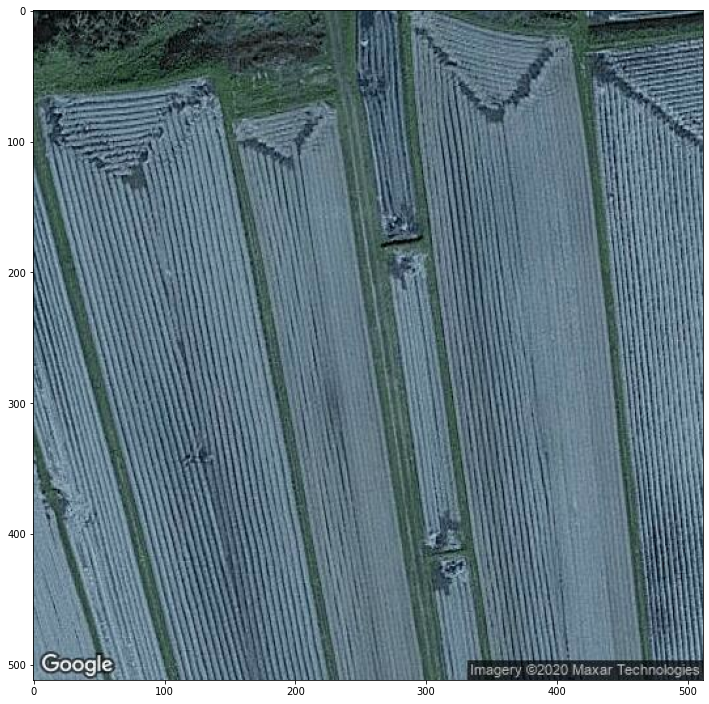

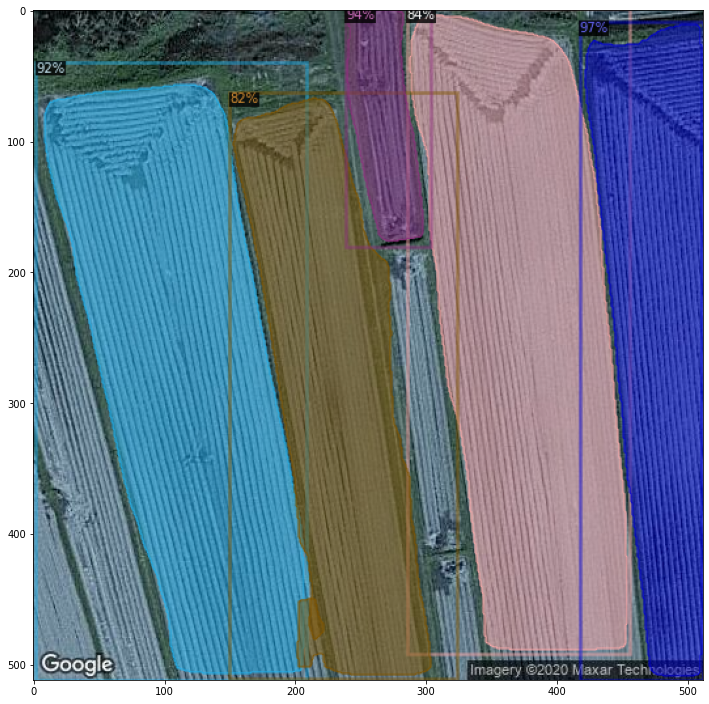

[1 1 1]


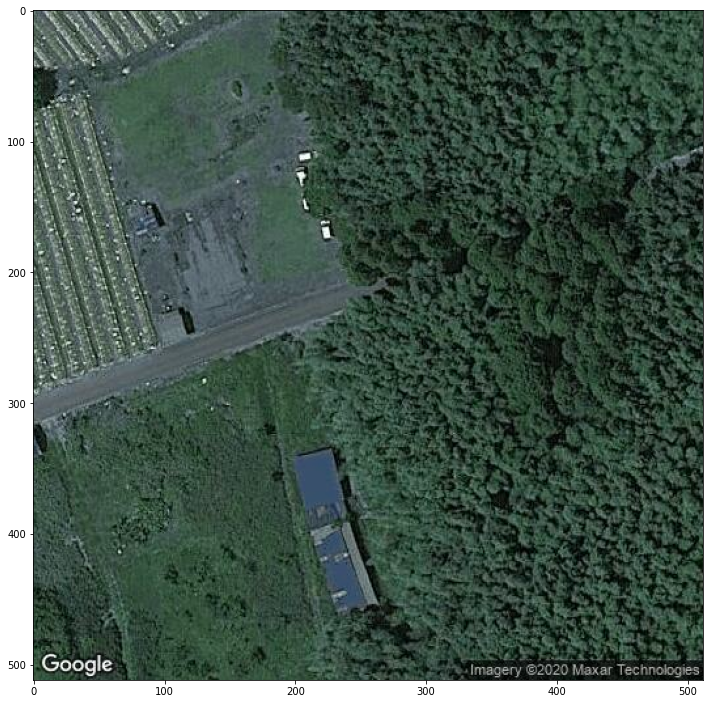

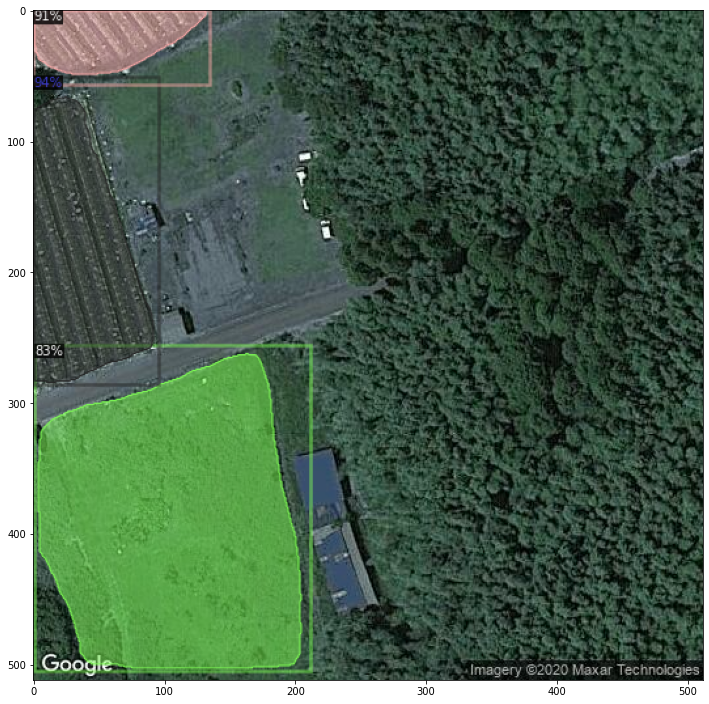

[1 1 1 1 1 1]


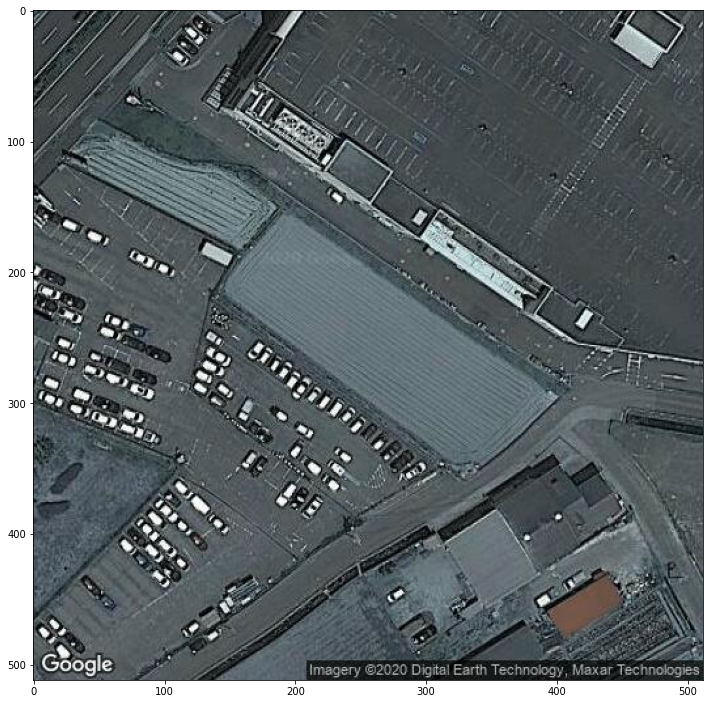

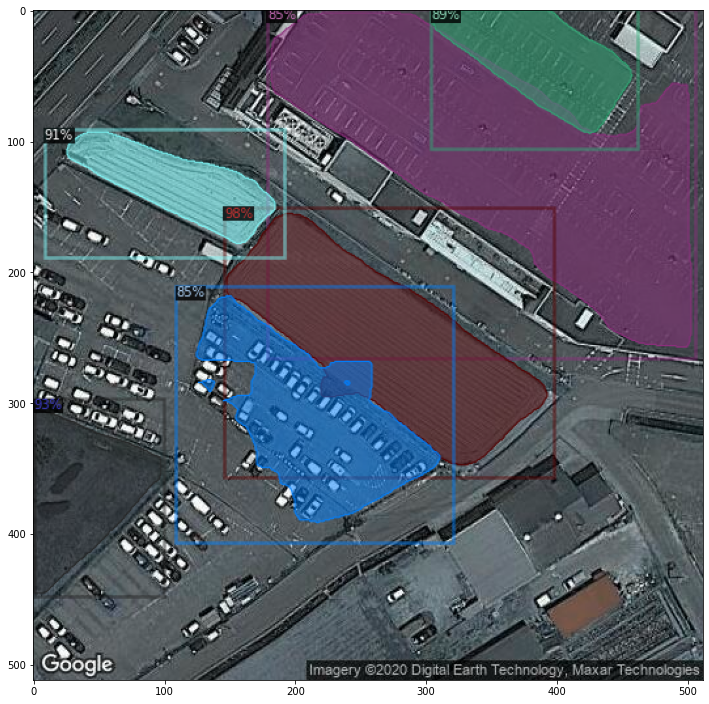

[1 1 1 1 1 1 1 1]


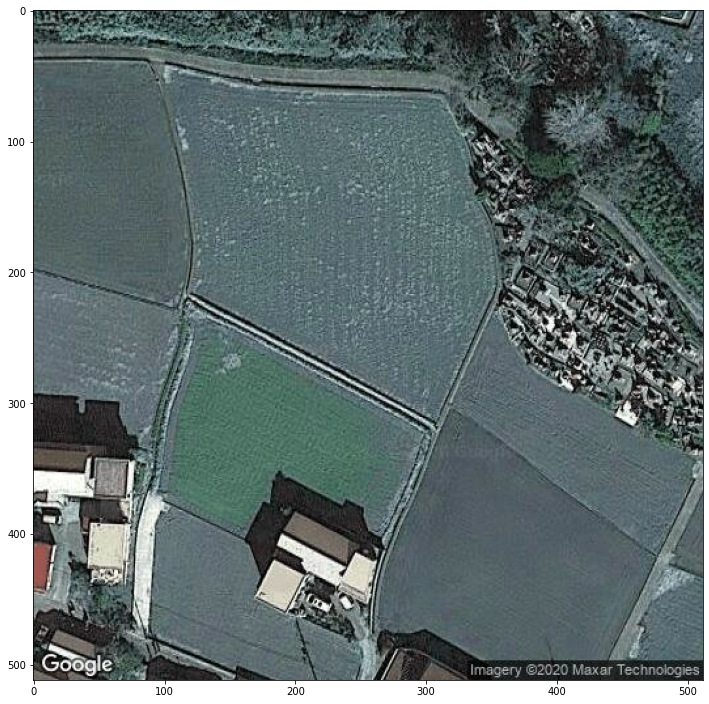

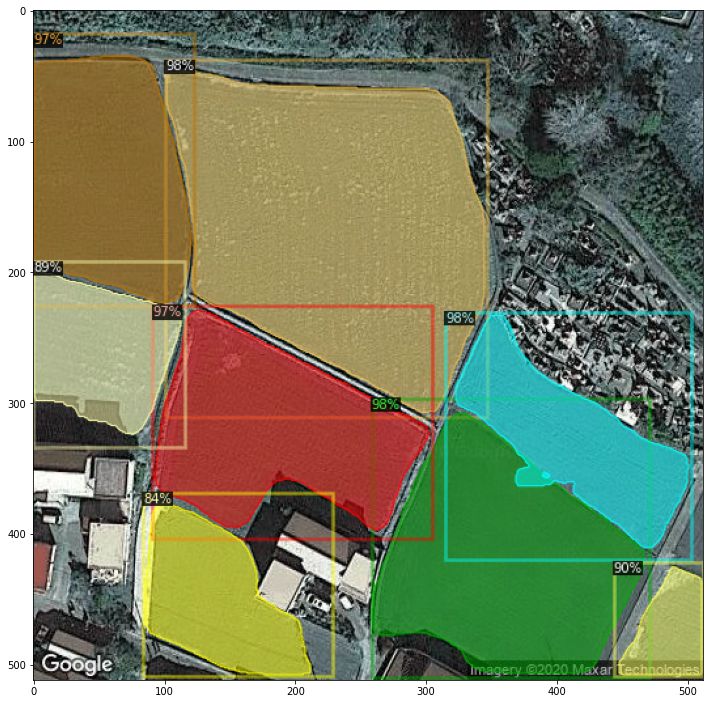

[1 1 1 1 1 1 1 1 1 1]


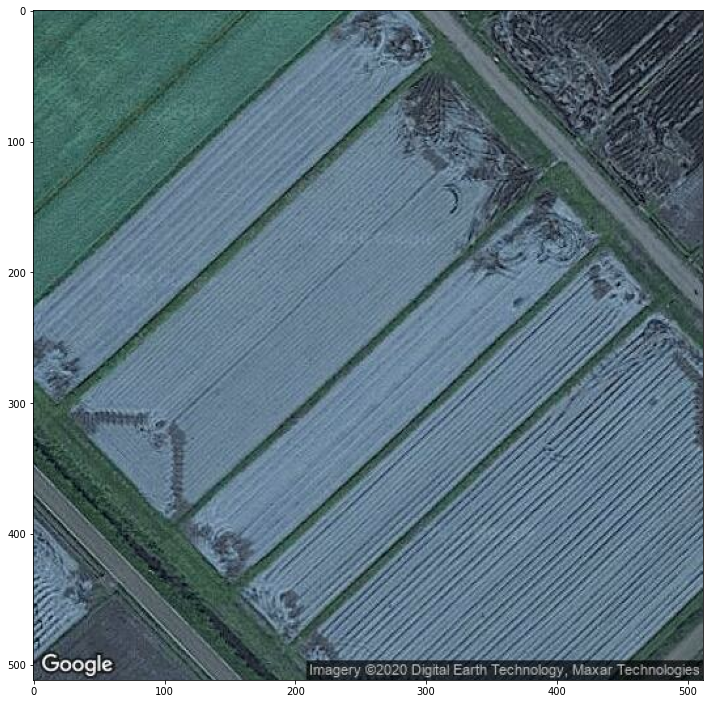

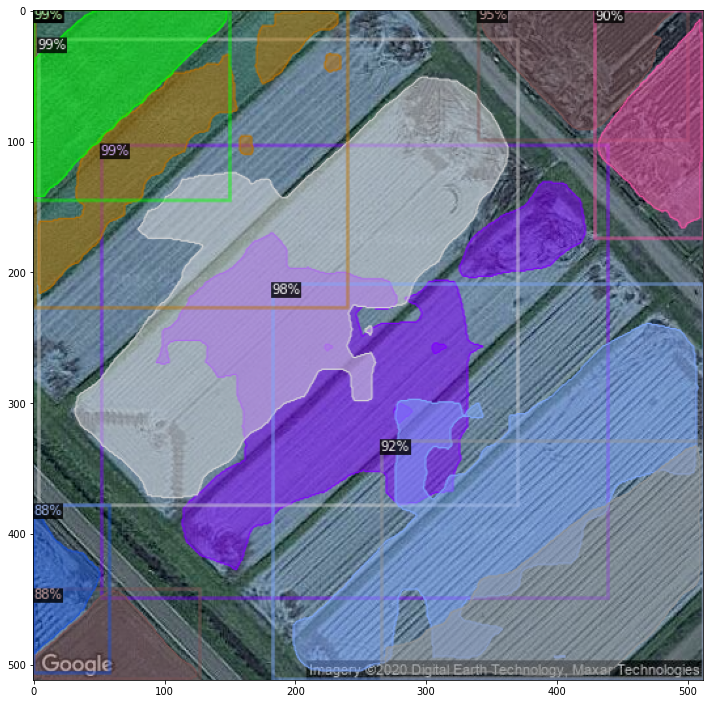

[1 1 1 1 1 1 1 1 1 1 1 1]


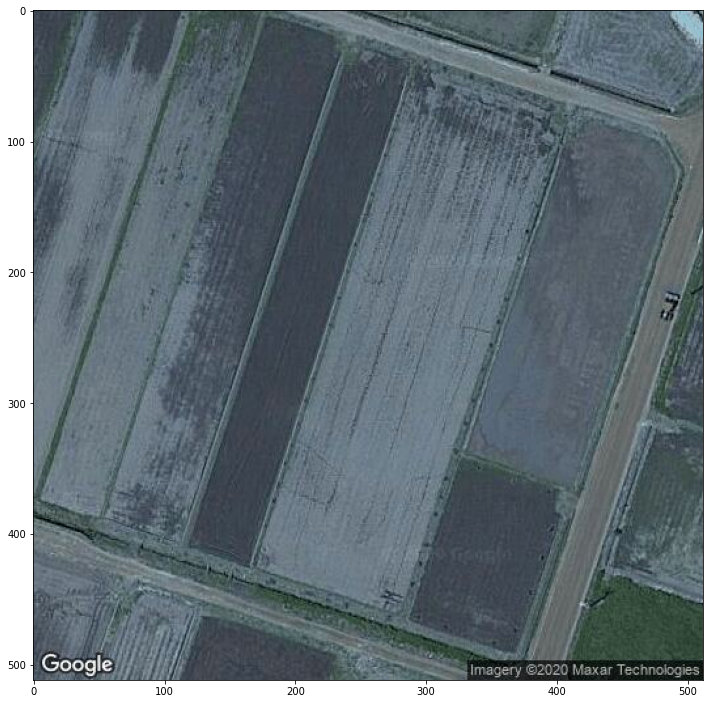

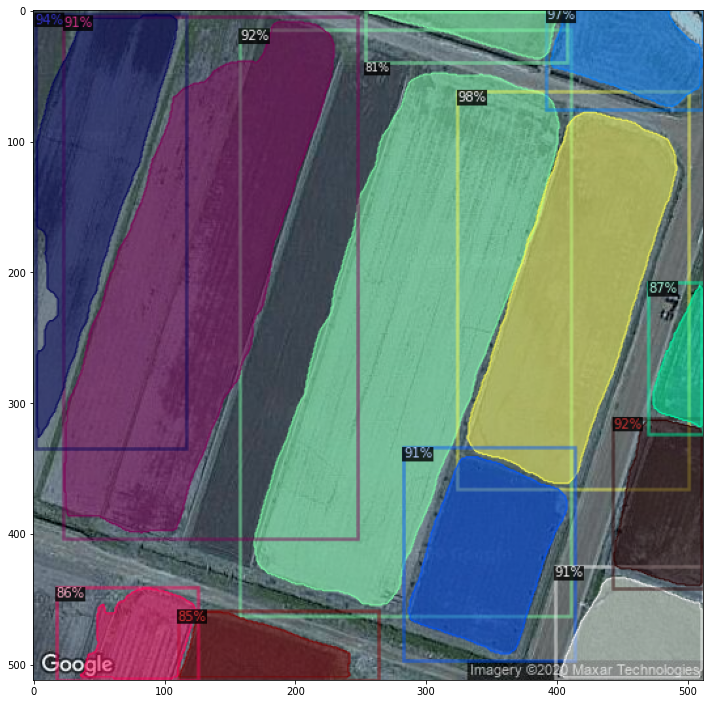

[1 1 1 1 1 1 1 1 1 1 1 1]


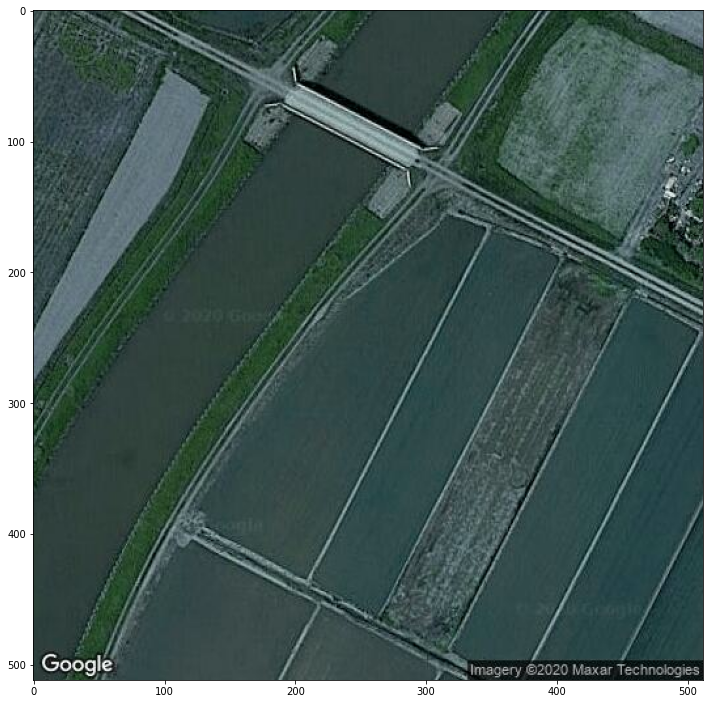

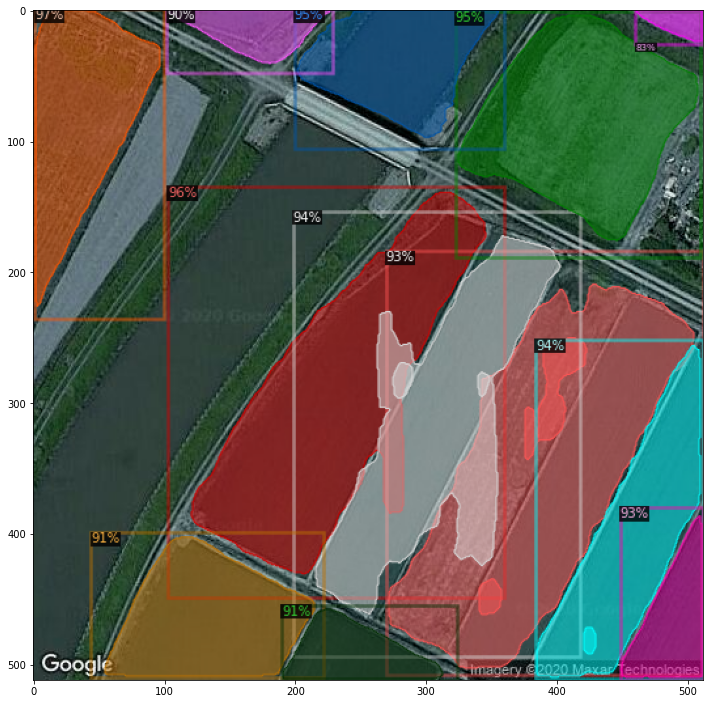

[1 1 1 1 1 1 1 1 1 1 1]


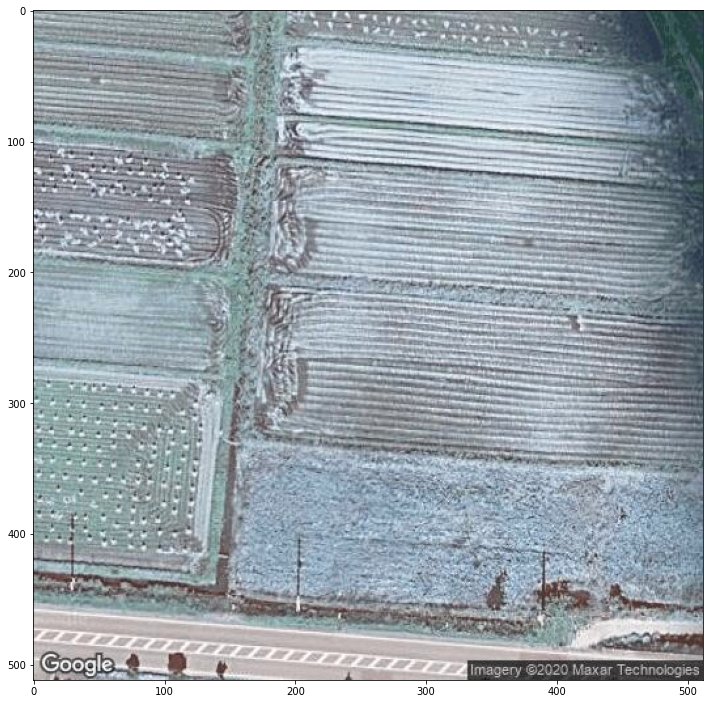

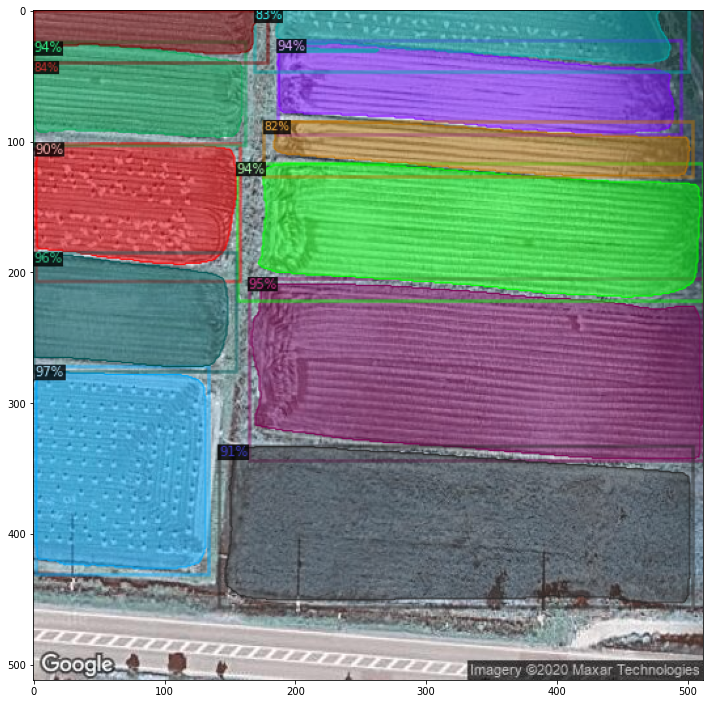

[1 1 1 1 1 1 1 1 1 1 1 1 1 1]


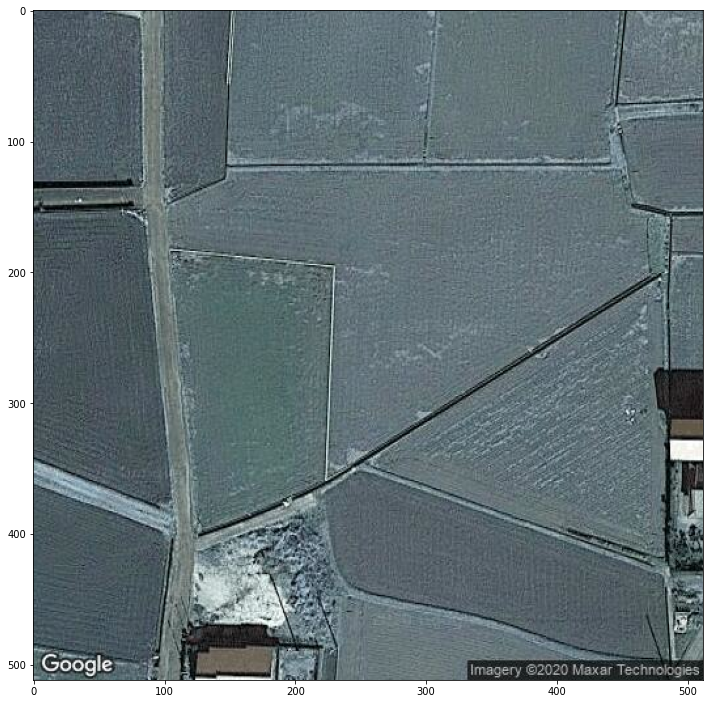

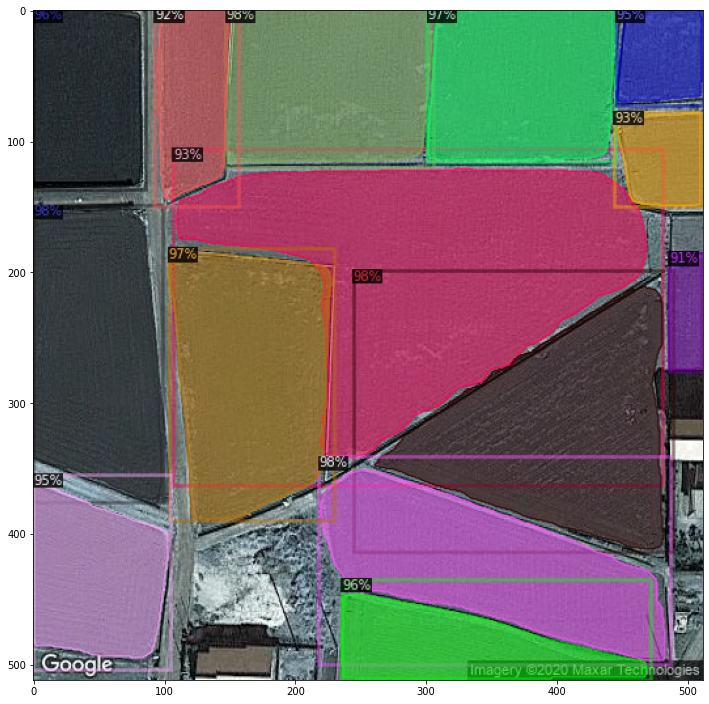

[1 1]


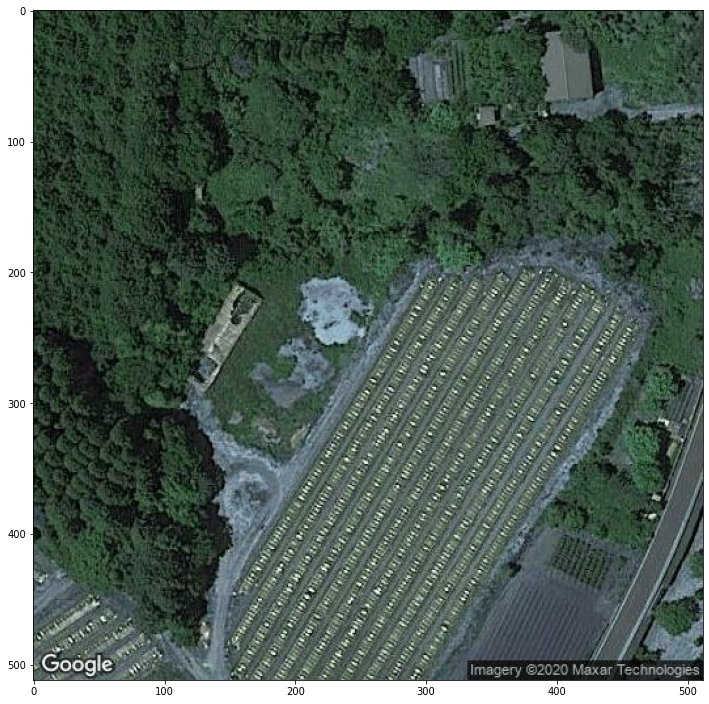

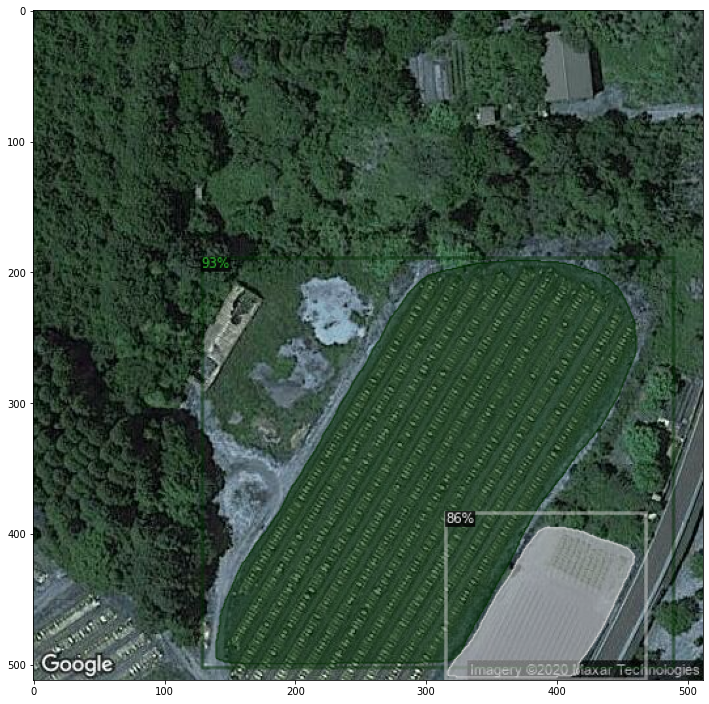

In [ ]:
# Let's perform inferencing on random samples and preview the predictions before proceeding.
if HEADLESS_MODE==False:
    for d in random.sample(dataset_dicts_val, 10):    
            im = cv2.imread(d["file_name"])
            outputs = predictor(im)
            categories = outputs["instances"].to("cpu").pred_classes.numpy()
            print(categories)
            predicted_boxes = outputs["instances"].to("cpu").pred_boxes
            
            if MODE=='segmentation-rle':
                pred_masks = outputs["instances"].to("cpu").pred_masks.numpy()

            v = Visualizer(im[:, :, ::-1],
                        metadata=metadata, 
            )
            v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
            
            plt.rcParams['figure.figsize'] = (12, 24)
            plt.imshow(im)
            plt.show()
            print("\n")
            ## For paperspace cloud notebooks. Cloud notebooks do not support cv2.imshow.
            plt.rcParams['figure.figsize'] = (12, 24)
            plt.imshow(v.get_image()[:, :, ::-1])
            plt.show()

# Delete existing model assisted labels from the Labelbox project

In [ ]:
#Delete all existing bulk import requests from the Project. This will delete predictions from queued datarows.

all_import_requests = get_current_import_requests()

for task in all_import_requests:
    response = delete_import_request(task['id'])
    print(response)

{'deleteBulkImportRequest': {'id': 'c8c4be6b-c7cf-42c4-be71-76a899f8904b', 'name': 'pre-labeling-12-18-2020-05-24-59'}}
{'deleteBulkImportRequest': {'id': '28344eb4-a4de-46a0-a07f-156cae74d662', 'name': 'pre-labeling-12-18-2020-05-18-13'}}
{'deleteBulkImportRequest': {'id': '65ee915c-ebe4-43b4-80c4-aab21ffdb1f3', 'name': 'pre-labeling-12-18-2020-05-02-53'}}
{'deleteBulkImportRequest': {'id': '5e43f7b1-d677-4ffc-a461-343c6468cd40', 'name': 'pre-labeling-12-18-2020-04-57-33'}}


# Compute unlabeled datarows

In [ ]:
## Get datarows that needs to be pre-labeled. We are performing a subtraction (all datarows in project - labeled datarows)

def compute_unlabeled_datarows(labels):
  datarow_ids_with_labels = []

  for label in labels:
      datarow_ids_with_labels.append(label['DataRow ID'])
      
  all_datarow_ids = []
  all_datarows = []

  for dataset_id in DATASETS:
      print(dataset_id)
      dataset = client.get_dataset(dataset_id)
      for data_row in dataset.data_rows():
          print(data_row)
          all_datarow_ids.append(data_row.uid)
          all_datarows.append(data_row)

  datarow_ids_queued = diff_lists(all_datarow_ids, datarow_ids_with_labels)

  print('Number of datarows to be pre-labeled: ', len(datarow_ids_queued))
  return all_datarows, datarow_ids_queued

In [ ]:
all_datarows, datarow_ids_queued = compute_unlabeled_datarows(ml_labels)

ckiifw3yb0a6u0y9bdl3805wl
<DataRow {'created_at': datetime.datetime(2020, 12, 10, 6, 7, 28, tzinfo=datetime.timezone.utc), 'external_id': '1_long133dot75462889671326-lati35dot4404480450168-size512-zoom19.jpg', 'row_data': 'https://storage.labelbox.com/ckifiiyf76tcl0753ufm5wqa1%2F7f359b17-8ac8-e2e4-b89b-cf70c38ebc3c-1_long133dot75462889671326-lati35dot4404480450168-size512-zoom19.jpg?Expires=1608705834968&KeyName=labelbox-assets-key-1&Signature=KpnOp46h7GI6wQq_3uKcfQdQMbM', 'uid': 'ckiifw4gu0caf0rct1xkc8dvn', 'updated_at': datetime.datetime(2020, 12, 10, 6, 7, 28, tzinfo=datetime.timezone.utc)}>
<DataRow {'created_at': datetime.datetime(2020, 12, 10, 6, 7, 28, tzinfo=datetime.timezone.utc), 'external_id': '1_long134dot62339371442795-lati33dot924050274202614-size512-zoom19.jpg', 'row_data': 'https://storage.labelbox.com/ckifiiyf76tcl0753ufm5wqa1%2Fefe8e811-b9b0-f66b-0698-975b890d1225-1_long134dot62339371442795-lati33dot924050274202614-size512-zoom19.jpg?Expires=1608705834968&KeyName=labe

# Download unlabeled data for inferencing

In [ ]:
## Download queued datarows that needs to be pre-labeled

data_row_queued = []
data_row_queued_urls = []

for datarow in all_datarows:
    for datarow_id in datarow_ids_queued:
        if datarow.uid == datarow_id:
            data_row_queued.append(datarow)
            extension = os.path.splitext(datarow.external_id)[1]
            filename = datarow.uid + extension
            data_row_queued_urls.append((DATA_LOCATION+'inference/' + filename, datarow.row_data))

print('Downloading queued data for inferencing...\n')
filepath_inference = ThreadPool(NUM_CPU_THREADS).imap_unordered(download_files, data_row_queued_urls)
print('Success...\n')


Success...



In [ ]:
len(data_row_queued)

49

# Perform inferencing

In [ ]:
## Inferencing on queued datarows and create labelbox annotation import file (https://labelbox.com/docs/automation/model-assisted-labeling)

predictions = []
counter = 1

print("Inferencing...\n")
time.sleep(1)
bar = progressbar.ProgressBar(maxval=len(data_row_queued), \
    widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])
bar.start()
    
for datarow in data_row_queued:
    extension = os.path.splitext(datarow.external_id)[1]
    filename = DATA_LOCATION+'inference/' + datarow.uid + extension
    im = cv2.imread(filename)
    
    ##Predict using FB Detectron2 predictor
    outputs = predictor(im)
    
    categories = outputs["instances"].to("cpu").pred_classes.numpy()
    predicted_boxes = outputs["instances"].to("cpu").pred_boxes

    if len(categories) != 0:
        for i in range(len(categories)):
            
            classname = "Farmland"
            
            for item in ontology:
                if classname==item['name']:
                    schema_id = item['featureSchemaId']
            
            if MODE=='segmentation-rle':
                pred_mask = outputs["instances"][i].to("cpu").pred_masks.numpy()
                cloud_mask = mask_to_cloud(im,pred_mask, datarow.uid,BUCKET_NAME)
                mask = {'instanceURI': cloud_mask, "colorRGB": [255,255,255]}
                predictions.append({"uuid": str(uuid4()),'schemaId': schema_id, 'mask': mask, 'dataRow': { 'id': datarow.uid }})
            
    print('\predicted '+ str(counter) + ' of ' + str(len(data_row_queued)))
    bar.update(counter)
    counter = counter + 1
          
bar.finish()
time.sleep(1)
print('Total annotations predicted: ', len(predictions))

Inferencing...



\predicted 1 of 49


\predicted 2 of 49


\predicted 3 of 49


\predicted 4 of 49


\predicted 5 of 49


\predicted 6 of 49


\predicted 7 of 49


\predicted 8 of 49


\predicted 9 of 49


\predicted 10 of 49


\predicted 11 of 49


\predicted 12 of 49


\predicted 13 of 49


\predicted 14 of 49


\predicted 15 of 49


\predicted 16 of 49


\predicted 17 of 49


\predicted 18 of 49


\predicted 19 of 49


\predicted 20 of 49


\predicted 21 of 49


\predicted 22 of 49


\predicted 23 of 49


\predicted 24 of 49


\predicted 25 of 49


\predicted 26 of 49


\predicted 27 of 49


\predicted 28 of 49


\predicted 29 of 49


\predicted 30 of 49


\predicted 31 of 49


\predicted 32 of 49


\predicted 33 of 49


\predicted 34 of 49


\predicted 35 of 49


\predicted 36 of 49


\predicted 37 of 49


\predicted 38 of 49


\predicted 39 of 49


\predicted 40 of 49


\predicted 41 of 49


\predicted 42 of 49


\predicted 43 of 49


\predicted 44 of 49


\predicted 45 of 49


\predicted 46 of 49


\predicted 47 of 49


\predicted 48 of 49


\predicted 49 of 49


Total annotations predicted:  458


In [ ]:
predictions

[{'dataRow': {'id': 'ckiifw4gu0caf0rct1xkc8dvn'},
  'mask': {'colorRGB': [255, 255, 255],
   'instanceURI': 'https://storage.googleapis.com/test-ml-assisted-labeling/baebcad6-5af0-404a-a1b4-02a9e32d99cb.png?Expires=1614668133&GoogleAccessId=auto-polygon-service%40auto-polygon.iam.gserviceaccount.com&Signature=WZcYuxe%2Ba3Hw3oEeQ%2F1OmUGuPv4EbqfkCnCj5dPs4PdR4RKuczqdAwzcGure%2BA6joGubeuBF7S5hm66jKxUc%2FcJFy3ujrQhckbhf9MjIlaosSWBzPyD9d64%2FzAqyVjjNKTPpgN%2FCiuk%2BLs589%2BUcu1nHM%2BtW7vymsufy48L2YkgKOjITd9zrNlJs%2BV2pi4rl6%2Fm8nC8ozi%2FZcOvRENfaYKzNbiA7sK%2FGLsx2iUp%2BgsK%2FW6mUJnhTkkTH86NSFersdrXzcbCpS1qcJBuU9i69Agjy9h4on06RKd72jCT5KpksmLLLG%2FVFheFXH3Lp2Yu8R48BFcEG%2B8qsNfzS7n0MQw%3D%3D'},
  'schemaId': 'ckii2d5b408m60y75aqs669qj',
  'uuid': '833121cf-1eaa-43ce-99a2-2f79a1e71c03'},
 {'dataRow': {'id': 'ckiifw4gu0caf0rct1xkc8dvn'},
  'mask': {'colorRGB': [255, 255, 255],
   'instanceURI': 'https://storage.googleapis.com/test-ml-assisted-labeling/50699277-5c5c-4f27-89d5-ec73aa779821.png?Ex

# Upload model predictions to Labelbox

In [ ]:
##Upload predicted annotations to Labelbox project
def upload_model_predictions_to_labelbox(project):
  now = datetime.now() # current date and time
  job_name = 'pre-labeling-' + str(now.strftime("%m-%d-%Y-%H-%M-%S"))

  upload_job = project.upload_annotations( 
      name=job_name, 
      annotations=predictions)

  print(upload_job)



  upload_job.wait_until_done()
  assert ( 
      upload_job.state == BulkImportRequestState.FINISHED or
      upload_job.state == BulkImportRequestState.FAILED
  )

  print(upload_job.state)
  print("--- Finished in %s seconds ---" % (time.time() - start_time))
  return upload_job

In [ ]:
upload_job = upload_model_predictions_to_labelbox(pro_ml)


<BulkImportRequest {'created_at': datetime.datetime(2020, 12, 22, 6, 58, 41, 970000, tzinfo=datetime.timezone.utc), 'error_file_url': None, 'input_file_url': 'https://storage.googleapis.com/labelbox-predictions-import-prod/uploaded_predictions/ckifiiyf76tcl0753ufm5wqa1/6ff4ea8f-5d7f-c6c0-2b64-57b3b11baa94-ckitso57wf3eg07187z36noxx__pre-labeling-12-22-2020-06-58-40.ndjson?GoogleAccessId=api-prod%40labelbox-193903.iam.gserviceaccount.com&Expires=1608623922&Signature=jpl1uyMt1Hwuk5mmez%2Ftaa7QYiL5FrPkSuVR1dbrZPT33ix43CvAO86h0Riox5G7hKFJggZ75dUuVLZY1B9QnYZ5YmuGSsMhIofo0vw2FLpHtCwQAU2UVc4h3XApxs15ddvBjRIIamawLIun1HuePD47gA7%2B1JRkXgs%2BlVBoF6rHfotrJzeutiickxXR5loby0Bc1ENKuIgC9%2FODmO%2FVxNA197tKwHXpPP9knlLPa%2FSir%2BragBu%2BVdUQJL5IIbtAui6BG9kv8n2UJy3BTxCB72SMLIOelpdytfsxyF6MnlZToGgMPsPqQvSLodtF8L4kWpueykmLyG7nTUc%2B3AFSCw%3D%3D', 'name': 'pre-labeling-12-22-2020-06-58-40', 'state': <BulkImportRequestState.RUNNING: 'RUNNING'>, 'status_file_url': None, 'uid': '0833b012-735e-4bcf-8c54-05aecc6

In [ ]:
print(upload_job)

<BulkImportRequest {'created_at': datetime.datetime(2020, 12, 22, 6, 58, 41, 970000, tzinfo=datetime.timezone.utc), 'error_file_url': 'https://storage.googleapis.com/labelbox-predictions-import-prod/errors/0833b012-735e-4bcf-8c54-05aecc6e22cf.ndjson?GoogleAccessId=api-prod%40labelbox-193903.iam.gserviceaccount.com&Expires=1608706909&Signature=HwKxkOvCC%2BLrek2uYxQMBOUrBIkPGQABA3p0%2FNVDG%2FPGpeI%2BkUDVGbE2mPOdQD7KDtMA9FuZENsTgt6fq1S0neVuePdP0ocrnkWIahH6ifHQhl86zauDbsVQ2cUzJEF4t1G4CHvkfEPBpFoBorG3SfvKZBRhCJWdWiOS%2BsodPXWDZr9veawV80ugCxHqIHoZdrnOpdxB5ECLEGmokREo24igjgdbfzyF84Zy06F1cjQJ4nGwLOS%2FRrHmN3hUE46nAgUXsytRjSAq7xautLht%2FgUP3sNuG2nFvIX%2FbPUh5rgVXGZm7eLD7eVnmvFP3naFMRhOGjieT7r5j2yZhxIT2g%3D%3D', 'input_file_url': 'https://storage.googleapis.com/labelbox-predictions-import-prod/uploaded_predictions/ckifiiyf76tcl0753ufm5wqa1/6ff4ea8f-5d7f-c6c0-2b64-57b3b11baa94-ckitso57wf3eg07187z36noxx__pre-labeling-12-22-2020-06-58-40.ndjson?GoogleAccessId=api-prod%40labelbox-193903.iam.gservice

print(upload_job)


<BulkImportRequest {'created_at': datetime.datetime(2020, 12, 22, 6, 58, 41, 970000, tzinfo=datetime.timezone.utc), 'error_file_url': None, 'input_file_url': 'https://storage.googleapis.com/labelbox-predictions-import-prod/uploaded_predictions/ckifiiyf76tcl0753ufm5wqa1/6ff4ea8f-5d7f-c6c0-2b64-57b3b11baa94-ckitso57wf3eg07187z36noxx__pre-labeling-12-22-2020-06-58-40.ndjson?GoogleAccessId=api-prod%40labelbox-193903.iam.gserviceaccount.com&Expires=1608623922&Signature=jpl1uyMt1Hwuk5mmez%2Ftaa7QYiL5FrPkSuVR1dbrZPT33ix43CvAO86h0Riox5G7hKFJggZ75dUuVLZY1B9QnYZ5YmuGSsMhIofo0vw2FLpHtCwQAU2UVc4h3XApxs15ddvBjRIIamawLIun1HuePD47gA7%2B1JRkXgs%2BlVBoF6rHfotrJzeutiickxXR5loby0Bc1ENKuIgC9%2FODmO%2FVxNA197tKwHXpPP9knlLPa%2FSir%2BragBu%2BVdUQJL5IIbtAui6BG9kv8n2UJy3BTxCB72SMLIOelpdytfsxyF6MnlZToGgMPsPqQvSLodtF8L4kWpueykmLyG7nTUc%2B3AFSCw%3D%3D', 'name': 'pre-labeling-12-22-2020-06-58-40', 'state': <BulkImportRequestState.RUNNING: 'RUNNING'>, 'status_file_url': None, 'uid': '0833b012-735e-4bcf-8c54-05aecc6e22cf'}>
BulkImportRequestState.FINISHED
--- Finished in 3047.1814584732056 seconds ---